<a href="https://colab.research.google.com/github/allisonlinn/CSUREMM/blob/main/sentimentdetrending.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from google.colab import files

uploaded_files = files.upload()
file_name = next(iter(uploaded_files))  # Assuming you uploaded only one file
data = pd.read_csv(file_name)

Saving VADER_all_headlines_concatenated - VADER_all_headlines.csv to VADER_all_headlines_concatenated - VADER_all_headlines.csv


In [ ]:
from datetime import datetime

scores = data['compound'].tolist()
date_strings = data['date'].tolist()

date_times = []
errors = []
months = []

for date_str in date_strings:
    try:
        date_time = datetime.strptime(date_str, '%m/%d/%Y')
        date_times.append(date_time)
    except ValueError as e:
        errors.append((date_str, str(e)))

for date_time in date_times:
  month = date_time.strftime('%m')
  months.append(month)

print("\nErrors:")
for date_str, error_msg in errors:
    print(f"Date string: {date_str}, Error message: {error_msg}")

new_data = pd.DataFrame({'date': date_strings,'datetime': date_times, 'months': months,'sentiment': scores})

seasons = []
for month in months:
  if month in ['01', '02', '03']:
      seasons.append('winter')
  elif month in ['04', '05', '06']:
        seasons.append('spring')
  elif month in ['07', '08', '09']:
        seasons.append('summer')
  else:
        seasons.append('fall')

new_data = pd.DataFrame({'datetime': date_times, 'season': seasons,'sentiment': scores})

mean_values = new_data.groupby('season')['sentiment'].mean()
print(mean_values)

frame = new_data.head(276)
frame.head()


Errors:
season
fall     -0.021965
spring    0.029141
summer   -0.042983
winter   -0.049097
Name: sentiment, dtype: float64


,datetime,season,sentiment
0,2014-01-03,winter,0.2023
1,2014-01-07,winter,-0.1280
2,2014-01-08,winter,0.0000
3,2014-01-10,winter,0.1531
4,2014-01-13,winter,0.0000


In [ ]:
from datetime import datetime
import pandas as pd

scores = data['compound'].tolist()
date_strings = data['date'].tolist()

date_times = []
errors = []
months = []

for date_str in date_strings:
    try:
        date_time = datetime.strptime(date_str, '%m/%d/%Y')
        date_times.append(date_time)
    except ValueError as e:
        errors.append((date_str, str(e)))

for date_time in date_times:
    month = date_time.strftime('%m')
    months.append(month)

print("\nErrors:")
for date_str, error_msg in errors:
    print(f"Date string: {date_str}, Error message: {error_msg}")

new_data = pd.DataFrame({'date': date_strings, 'datetime': date_times, 'months': months, 'sentiment': scores})

seasons = []
for month in months:
    if month in ['01', '02', '03']:
        seasons.append('winter')
    elif month in ['04', '05', '06']:
        seasons.append('spring')
    elif month in ['07', '08', '09']:
        seasons.append('summer')
    else:
        seasons.append('fall')

new_data['season'] = seasons
new_data['year'] = new_data['datetime'].dt.year

mean_values = new_data.groupby(['season', 'year'])['sentiment'].transform('mean')

new_data['seasonal_mean'] = mean_values
new_data['sentiment_deviation'] = new_data['sentiment'] - mean_values

deseasonalized = new_data[['datetime', 'season', 'seasonal_mean', 'sentiment_deviation']]
print(deseasonalized)

# Save the DataFrame as a !CSV file
deseasonalized.to_csv('deseasonalized.csv', index=False)

# Download the !CSV file
files.download('deseasonalized.csv')


Errors:
       datetime  season  seasonal_mean  sentiment_deviation
0    2014-01-03  winter       0.004803             0.197497
1    2014-01-07  winter       0.004803            -0.132803
2    2014-01-08  winter       0.004803            -0.004803
3    2014-01-10  winter       0.004803             0.148297
4    2014-01-13  winter       0.004803            -0.004803
...         ...     ...            ...                  ...
2930 2023-05-26  spring       0.059416            -0.518216
2931 2023-05-19  spring       0.059416            -0.570016
2932 2023-05-29  spring       0.059416            -0.059416
2933 2023-05-07  spring       0.059416            -0.285716
2934 2023-05-28  spring       0.059416            -0.461316

[2935 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

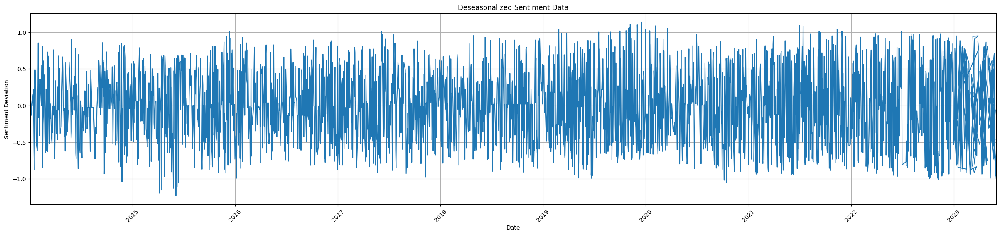

In [ ]:
import matplotlib.pyplot as plt

# Visualize the deseasonalized data
plt.figure(figsize=(30, 6))
plt.plot(deseasonalized['datetime'], deseasonalized['sentiment_deviation'])
plt.title('Deseasonalized Sentiment Data')
plt.xlabel('Date')
plt.ylabel('Sentiment Deviation')
plt.xticks(rotation=45)
plt.xlim(new_data['datetime'].min(), new_data['datetime'].max())  # Set x-axis limits
plt.grid(True)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have already imported the necessary libraries and have your data DataFrame

# Create the new_data DataFrame
scores = frame['sentiment'].tolist()
dates = frame['date'].tolist()
new_data = pd.DataFrame({'date': dates, 'sentiment': scores})

# Create the plot
fig, ax = plt.subplots(figsize=(276, 30))  # Adjust the width and height as desired

# Plot the data
ax.plot(new_data['date'], new_data['sentiment'])

# Set the limits of the x-axis
ax.set_xlim(0, 276)  # Adjust the values according to your desired range

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Sentiment')
plt.title('Raw Graph')

# Adjust the spacing within the figure
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)  # Adjust the values as needed

# Display the plot
plt.show()

In [ ]:
#Constant
from scipy.signal import detrend

detrended = detrend(frame['sentiment'], type='constant')
constant = pd.Series(detrended, index=frame.index)

plt.figure(figsize=(276, 30))  # Adjust the width and height as desired
plt.plot(frame['date'], constant)

'''plt.xlim(0, 276)  # Adjust the values according to your desired range
plt.xlabel('Date')
plt.ylabel('Detrended Sentiment')
plt.title('Detrended Sentiment Graph')
plt.plot(constant)'''

"plt.xlim(0, 276)  # Adjust the values according to your desired range\nplt.xlabel('Date')\nplt.ylabel('Detrended Sentiment')\nplt.title('Detrended Sentiment Graph')\nplt.plot(constant)"

In [ ]:
#Linear
detrended = detrend(frame['sentiment'], type='linear')
linear = pd.Series(detrended, index=frame.index)

plt.figure(figsize=(276, 30))  # Adjust the width and height as desired
plt.plot(frame['date'], linear)

In [ ]:
#Quadratic
from statsmodels.tsa.tsatools import detrend
quadratic = detrend(frame['sentiment'], order=2)

plt.figure(figsize=(276, 30))  # Adjust the width and height as desired
plt.plot(frame['date'], quadratic)

In [ ]:
# Using scipy: Subtract the line of best fit
from scipy import signal
detrended = signal.detrend(new_data['sentiment'].values)
plt.figure(figsize=(276, 50))
plt.plot(detrended)
plt.title('Sentiment detrended by subtracting the least squares fit', fontsize=16)

Text(0.5, 1.0, 'Sentiment detrended by subtracting the least squares fit')